# PCA Index Dashboard Examples

In [1]:
import pandas as pd
import plotly.express as px

import config
import load_fred
import pca_index

DATA_DIR = config.DATA_DIR

import warnings
warnings.filterwarnings("ignore")

In [2]:
now = pd.Timestamp.utcnow()
# convert now to central time 
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2024-03-26 12:24:52.050881+00:00 (UTC)
In US/Central Time, this is 2024-03-26 07:24:52.050881-05:00


In [3]:
df = load_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)
dfn

,High Yield Index OAS,10Y-2Y Spread,VIX,"CP - Treasury Spread, 3m",NASDAQ Ret (transformed),10-Year Treasury (transformed)
DATE,,,,,,
1997-01-02,-0.896829,-0.474387,0.086357,-0.009098,0.545129,0.254474
1997-01-03,-0.885119,-0.474387,-0.155452,0.006408,0.744723,0.205305
1997-01-06,-0.881216,-0.474387,-0.064022,-0.016851,0.777603,0.269262
1997-01-07,-0.881216,-0.453568,-0.128986,-0.047862,0.837233,0.382902
1997-01-08,-0.892926,-0.453568,-0.021916,-0.086627,0.785264,0.496150
...,...,...,...,...,...,...
2024-03-19,-0.881216,-1.463278,-0.794264,1.657773,0.738744,0.558610
2024-03-20,-0.865603,-1.400822,-0.888100,1.719796,0.827918,0.465823
2024-03-21,-0.900732,-1.432050,-0.902537,1.727549,0.836540,0.472564


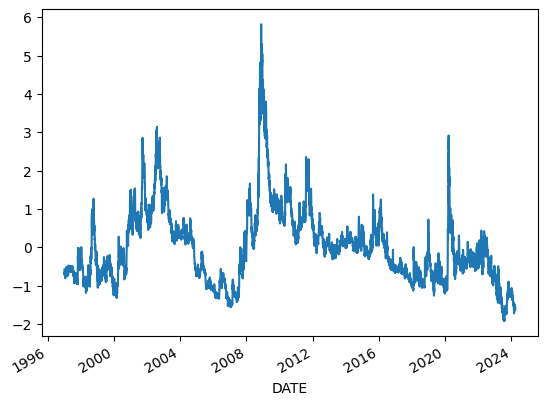

In [4]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [5]:
pc1

DATE
1997-01-02   -0.577029
1997-01-03   -0.683140
1997-01-06   -0.666050
1997-01-07   -0.702402
1997-01-08   -0.672075
                ...   
2024-03-19   -1.571790
2024-03-20   -1.595934
2024-03-21   -1.625944
2024-03-22   -1.583077
2024-03-25   -1.569650
Name: PC1, Length: 7194, dtype: float64

<Axes: xlabel='DATE'>

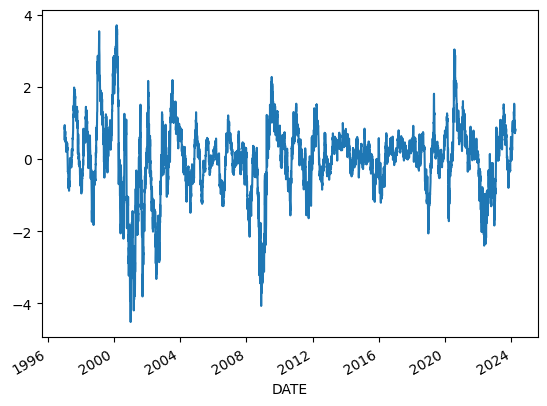

In [6]:
# NEW PLOT
dfn['NASDAQ Ret (transformed)'].plot()

In [7]:
fig = px.line(pc1)
fig.show()

In [8]:
# Simple version
fig = px.line(pc1)
fig.show()

In [9]:
# Using slider and quick views
pca_index.pc1_line_plot(pc1)

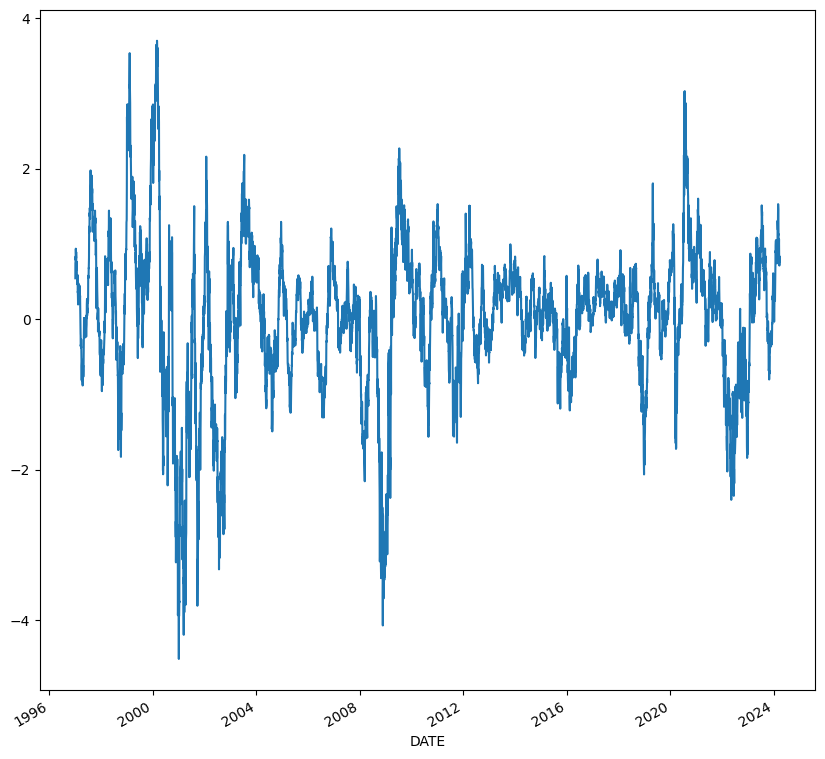

In [10]:
## Visualize normalized and raw series
dfn['NASDAQ Ret (transformed)'].plot(subplots=True, figsize=(10, 10));


In [11]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [12]:
pca_index.plot_unnormalized_series(df)

In [13]:
pca_index.plot_normalized_series(dfn)